In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [2]:
dataframe= pd.read_csv('Womens Clothing E-Commerce Reviews.csv',index_col=0)
dataframe.head()

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [3]:
dataframe.shape

(23486, 10)

In [5]:
dataframe[dataframe['Division Name'].isnull() & dataframe['Department Name'].isnull() & dataframe['Class Name'].isnull()] 

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
9444,72,25,My favorite socks!!!,"I never write reviews, but these socks are so ...",5,1,0,NaN,NaN,NaN
13767,492,23,So soft!,I just love this hoodie! it is so soft and com...,5,1,1,NaN,NaN,NaN
13768,492,49,Wardrobe staple,Love this hoodie. so soft and goes with everyt...,5,1,0,NaN,NaN,NaN
13787,492,48,NaN,NaN,5,1,0,NaN,NaN,NaN
16216,152,36,Warm and cozy,"Just what i was looking for. soft, cozy and warm.",5,1,0,NaN,NaN,NaN
16221,152,37,Love!,I am loving these. they are quite long but are...,5,1,0,NaN,NaN,NaN
16223,152,39,"""long and warm""",These leg warmers are perfect for me. they are...,5,1,0,NaN,NaN,NaN
18626,184,34,Nubby footless tights,"These are amazing quality. i agree, size up to...",5,1,5,NaN,NaN,NaN
18671,184,54,New workhorse,These tights are amazing! if i care for them w...,5,1,0,NaN,NaN,NaN
20088,772,50,Comfy sweatshirt!,This sweatshirt is really nice! it's oversize...,5,1,0,NaN,NaN,NaN


In [6]:
# We shalll copy values of dataframe to df and use it, enabling us to modify row values for calculation
df = dataframe.fillna("")
df['joint_feedback'] = df['Title'] +' '+ df['Review Text']
df.head()

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,joint_feedback
0,767,33,,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,Absolutely wonderful - silky and sexy and com...
1,1080,34,,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses,Love this dress! it's sooo pretty. i happen...
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses,Some major design flaws I had such high hopes ...
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants,"My favorite buy! I love, love, love this jumps..."
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses,Flattering shirt This shirt is very flattering...


## Building Corpus using lemmatzation and labels using dependecy parsing

In [7]:
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download("wordnet")
nltk.download("omw-1.4")
#to lower, lemmatize and remove special characters from reviews and store them in corpus[]
wnl = WordNetLemmatizer()
corpus = []
for i in df.index:
    review = re.sub('[^a-zA-Z]', ' ', df['joint_feedback'][i])
    review = review.lower()
    review = review.split()
    review = [wnl.lemmatize(word, pos="v") for word in review]
    review = ' '.join(review)
    corpus.append(review)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\prish\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\prish\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\prish\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [8]:
corpus[:10]

['absolutely wonderful silky and sexy and comfortable',
 'love this dress it s sooo pretty i happen to find it in a store and i m glad i do bc i never would have order it online bc it s petite i buy a petite and be i love the length on me hit just a little below the knee would definitely be a true midi on someone who be truly petite',
 'some major design flaw i have such high hop for this dress and really want it to work for me i initially order the petite small my usual size but i find this to be outrageously small so small in fact that i could not zip it up i reorder it in petite medium which be just ok overall the top half be comfortable and fit nicely but the bottom half have a very tight under layer and several somewhat cheap net over layer imo a major design flaw be the net over layer sew directly into the zipper it c',
 'my favorite buy i love love love this jumpsuit it s fun flirty and fabulous every time i wear it i get nothing but great compliment',
 'flatter shirt this shirt

In [9]:
!python -m spacy download en_core_web_sm

     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     --------------------------------------- 0.0/12.8 MB 640.0 kB/s eta 0:00:20
     --------------------------------------- 0.1/12.8 MB 525.1 kB/s eta 0:00:25
     --------------------------------------- 0.1/12.8 MB 651.6 kB/s eta 0:00:20
     --------------------------------------- 0.1/12.8 MB 651.6 kB/s eta 0:00:20
     --------------------------------------- 0.1/12.8 MB 651.6 kB/s eta 0:00:20
     --------------------------------------- 0.1/12.8 MB 651.6 kB/s eta 0:00:20
     --------------------------------------- 0.1/12.8 MB 308.0 kB/s eta 0:00:42
     --------------------------------------- 0.1/12.8 MB 405.9 kB/s eta 0:00:32
      -------------------------------------- 0.2/12.8 MB 455.1 kB/s eta 0:00:28
      -------------------------------------- 0.2/12.8 MB 528.4 kB/s eta 0:00:24
      -------------------------------------- 0.2/12.8 MB

In [10]:
import spacy
#label pair -> adjective and corresponding head (Kindly check Assumption # 1) 
labels = dict()
nlp = spacy.load("en_core_web_sm")
for c_id,sentence in zip(df['Clothing ID'],corpus) :
  doc = nlp(sentence)
  for token in doc:
      if str(token.dep_) == 'amod':
               tag= str(token.text)+ " " + str(token.head.text)
               if tag in labels:
                     labels[tag][0] += 1
                     labels[tag][1].add(c_id)
               else:
                     labels[tag] = [1,{c_id}]

## Filtering labels

In [11]:
print("Lables : ",labels)
print("Length of Labels:",len(labels))

Lables :  {'wonderful silky': [1, {767}], 'true midi': [1, {1080}], 'major flaw': [5, {867, 988, 1077, 862}], 'such hop': [14, {1024, 1122, 867, 1092, 965, 1028, 868, 875, 815, 945, 850, 819, 1077, 1078}], 'high hop': [80, {1024, 1028, 903, 1161, 1035, 535, 1049, 1054, 927, 806, 936, 815, 945, 1074, 819, 1076, 1077, 1078, 823, 1081, 1082, 1083, 828, 829, 1084, 1087, 831, 1086, 1089, 835, 1092, 965, 1094, 1095, 836, 1097, 1098, 844, 1104, 830, 850, 1111, 860, 861, 862, 993, 865, 867, 868, 1122, 872, 1001, 875, 876, 1008, 881, 886, 1016, 251, 380}], 'petite small': [67, {907, 1054, 1055, 1059, 931, 1062, 936, 809, 941, 1070, 1072, 1077, 1078, 1079, 824, 1080, 1081, 952, 823, 830, 831, 1086, 1089, 1091, 1093, 1094, 1095, 1099, 975, 1104, 850, 1107, 1110, 984, 860, 862, 872, 1001, 877, 895}], 'small size': [209, {1028, 1030, 1033, 1037, 1047, 1048, 1051, 1060, 1070, 1072, 1075, 1076, 1077, 1078, 1079, 1080, 1081, 1082, 1083, 1086, 576, 1089, 1091, 1092, 1093, 1094, 1095, 1098, 1099, 1101, 

In [59]:
filtered_labels = dict(filter(lambda x: labels[x[0]][0] >= 10 and len(labels[x[0]][1]) > 5, labels.items() ))
print("Filtered labels : ",list(filtered_labels.keys()))
print("Length of filtered labels:",len(filtered_labels))

Filtered labels :  ['such hop', 'high hop', 'petite small', 'small size', 'usual size', 'petite medium', 'top half', 'bottom half', 'adjustable tie', 'perfect length', 'small frame', 'little baggy', 'petite in', 'loose bite', 'light color', 'smallest size', 'little snug', 'fun dress', 'top look', 'lower half', 'small bust', 'larger bust', 'top layer', 'pretty color', 'average height', 'flatter look', 'white pant', 'great drape', 'small fit', 'different something', 'little dress', 'fit tts', 'good length', 'huge disappointment', 'dark blue', 'good quality', 'nice weight', 'great shirt', 'many compliment', 'great piece', 'beautiful color', 'only downside', 'back order', 'long length', 'good skirt', 'many top', 'skinny jeans', 'little bite', 'great top', 'casual top', 'nice cut', 'beautiful top', 'usual medium', 'great buy', 'sheer fabric', 'light fabric', 'nice fit', 'oversized fit', 'local retailer', 'larger size', 'comfortable material', 'super comfy', 'medium fit', 'cute top', 'nice p

In [125]:
# function declarations -> filter out labels with relation to 'target words' ["e-commerce","dress","product"] <= 0.35 and eliminatinng synonynous pairs
from sentence_transformers import SentenceTransformer, util 
import numpy as np 
from nltk.corpus import wordnet


model = SentenceTransformer('all-MiniLM-L6-v2')
def synonym_text(word):
       synonyms = [word]
       for syn in wordnet.synsets(word):
              for lm in syn.lemmas():
                     synonyms.append(lm.name())
       return list(set(synonyms))

final_label_list_split = []
def similarity_context(label):
       cos_sim = util.cos_sim(model.encode(["ecommerce","product","dress"]), model.encode(label))
       cos_sim = [float(x) for x in cos_sim]
       return max(cos_sim)
       

def synonym_labels(label):      
       cos_sim_2 = [0]
       adj,topic = label[0].split(' ')
       if final_label_list_split != []:
              for x in final_label_list_split:
                     if x[0] in synonym_text(adj) and x[1] in synonym_text(topic):
                            return False
                     
       if  similarity_context(label[0])>0.35:
              final_label_list_split.append((adj,topic))
              return True
       else:
              return False
       

In [129]:
# preparation for filtering out labels based on  relevance 
# sorting labels based on thier similarity, so we encounter most contextual relevant (symentically close to target words) first and eliminate their synonyms 
sorted_labels = sorted(filtered_labels, key= similarity_context,reverse=True)
print(sorted_labels)
for i in range(len(sorted_labels)):
    sorted_labels[i] = (sorted_labels[i],filtered_labels[sorted_labels[i]])


['comfy dress', 'comfortable dress', 'more dress', 'different dress', 'fun dress', 'fit dress', 'everyday dress', 'in dress', 'warm dress', 'casual dress', 'simple dress', 'other dress', 'many dress', 'light dress', 'pretty dress', 'most dress', 'true dress', 'loose dress', 'new dress', 'top dress', 'short dress', 'regular dress', 'best dress', 'large dress', 'good dress', 'perfect dress', 'white dress', 'small dress', 'same dress', 'elegant dress', 'cute dress', 'unique dress', 'black dress', 'soft dress', 'feminine dress', 'versatile dress', 'red dress', 'tunic dress', 'easy dress', 'blue dress', 'adorable dress', 'classic dress', 'similar dress', 'fabulous dress', 'wonderful dress', 'flatter dress', 'super dress', 'beautiful dress', 'cool dress', 'sleeveless dress', 'entire dress', 'whole dress', 'little dress', 'favorite dress', 'green dress', 'maxi dress', 'flowy dress', 'many outfit', 'lovely dress', 'nice dress', 'casual outfit', 'great dress', 'fantastic dress', 'breezy dress',

In [130]:
# Filtering out labels based on  relevance
final_label_list_split = []
sim_filtered_labels = dict(filter(synonym_labels, sorted_labels ))
print("Filtered labels post semantic checks: ",list(sim_filtered_labels.keys()))
print("Length of filtered labels after similarity with online dresses and synonyms grouping:",len(sim_filtered_labels))


Filtered labels post semantic checks:  ['comfy dress', 'more dress', 'different dress', 'fun dress', 'fit dress', 'everyday dress', 'in dress', 'warm dress', 'simple dress', 'other dress', 'many dress', 'light dress', 'pretty dress', 'most dress', 'true dress', 'new dress', 'top dress', 'regular dress', 'best dress', 'large dress', 'good dress', 'perfect dress', 'white dress', 'small dress', 'same dress', 'elegant dress', 'cute dress', 'unique dress', 'black dress', 'soft dress', 'feminine dress', 'versatile dress', 'red dress', 'tunic dress', 'blue dress', 'adorable dress', 'classic dress', 'similar dress', 'fabulous dress', 'wonderful dress', 'flatter dress', 'super dress', 'beautiful dress', 'cool dress', 'sleeveless dress', 'entire dress', 'whole dress', 'favorite dress', 'green dress', 'maxi dress', 'flowy dress', 'many outfit', 'nice dress', 'casual outfit', 'breezy dress', 'petite dress', 'great product', 'gorgeous dress', 'casual skirt', 'long skirt', 'waisted skirt', 'casual w

In [133]:
final_label_list_split


[('comfy', 'dress'),
 ('more', 'dress'),
 ('different', 'dress'),
 ('fun', 'dress'),
 ('fit', 'dress'),
 ('everyday', 'dress'),
 ('in', 'dress'),
 ('warm', 'dress'),
 ('simple', 'dress'),
 ('other', 'dress'),
 ('many', 'dress'),
 ('light', 'dress'),
 ('pretty', 'dress'),
 ('most', 'dress'),
 ('true', 'dress'),
 ('new', 'dress'),
 ('top', 'dress'),
 ('regular', 'dress'),
 ('best', 'dress'),
 ('large', 'dress'),
 ('good', 'dress'),
 ('perfect', 'dress'),
 ('white', 'dress'),
 ('small', 'dress'),
 ('same', 'dress'),
 ('elegant', 'dress'),
 ('cute', 'dress'),
 ('unique', 'dress'),
 ('black', 'dress'),
 ('soft', 'dress'),
 ('feminine', 'dress'),
 ('versatile', 'dress'),
 ('red', 'dress'),
 ('tunic', 'dress'),
 ('blue', 'dress'),
 ('adorable', 'dress'),
 ('classic', 'dress'),
 ('similar', 'dress'),
 ('fabulous', 'dress'),
 ('wonderful', 'dress'),
 ('flatter', 'dress'),
 ('super', 'dress'),
 ('beautiful', 'dress'),
 ('cool', 'dress'),
 ('sleeveless', 'dress'),
 ('entire', 'dress'),
 ('whole',

In [132]:
# Creating a dict based final label based final_label_list_split 
# dict key-> topic(head of adjective) , value -> dict with label values, synonyms to topic and encoder to all labels (to be used later)


final_labels = dict()
for adj,topic in final_label_list_split:
    if topic not in final_labels:
        final_labels[topic] = { 'synonyms': synonym_text(topic) ,"labels" : [adj+ " " +topic]}
    else:
        final_labels[topic]['labels'].append(adj+ " " +topic)

In [136]:
for topic in final_labels:
    final_labels[topic]['encoder'] = model.encode(final_labels[topic]['labels'] )

In [141]:
topic_list = list(final_labels.keys())
print(topic_list)

['dress', 'outfit', 'product', 'skirt', 'wear', 'style', 'suit', 'sweater', 'shirt', 'stylish', 'blouse', 'jacket', 'retailer', 'look', 'tailor', 'items', 'torso', 'be', 'purchase', 'fit', 'brand', 'sandals', 'jeans', 'waist', 'fabric', 'vest', 'color', 'bra', 'sleeves', 'slip', 'item', 'top', 'detail', 'buy', 'things', 'denim', 'piece', 'hips', 'price', 'material', 'order', 'store', 'size', 'life', 'love', 'waisted', 'part', 'work', 'quality', 'lace', 'people', 'design', 'bust', 'pair', 'coat', 'tunic', 'money', 'body', 'print', 'thing', 'tie', 'figure', 'pricey', 'length', 'sale', 'perfect', 'occasion', 'weight', 'me', 'compliment', 'something', 'value', 'pant', 'texture', 'bite', 'well']


In [147]:
# Manually removing labels whhich were missed out
final_labels.pop('tailor')
final_labels.pop('be')
final_labels.pop('order')
final_labels.pop('store')
final_labels.pop('life')
final_labels.pop('love')
final_labels.pop('part')
final_labels.pop('people')
final_labels.pop('sale')
final_labels.pop('occasion')
final_labels.pop('something')
final_labels.pop('me')
final_labels.pop('compliment')
final_labels.pop('bite')

{'synonyms': ['seize_with_teeth',
  'burn',
  'bite',
  'bit',
  'collation',
  'raciness',
  'chomp',
  'sting',
  'insect_bite',
  'morsel',
  'pungency',
  'snack',
  'prick',
  'sharpness'],
 'labels': ['big bite'],
 'encoder': array([[ 1.27659412e-02,  1.28053322e-01,  4.68018018e-02,
          1.53270047e-02, -3.29544358e-02, -4.09323759e-02,
          2.40384024e-02,  4.46630344e-02, -2.94387266e-02,
          5.37696183e-02, -1.90288443e-02, -6.79760426e-02,
         -6.67198524e-02,  2.67020259e-02, -6.75889254e-02,
          3.10969856e-02,  2.13235132e-02, -7.85631016e-02,
         -6.86322227e-02, -5.58854714e-02, -6.42467737e-02,
          9.17592570e-02,  4.97871498e-03,  2.04441044e-02,
         -6.76860064e-02,  4.11764495e-02,  1.66274197e-02,
         -3.63338888e-02,  1.21604972e-01, -2.89204717e-02,
         -6.12637550e-02,  4.19624746e-02,  5.49548864e-02,
         -3.65013406e-02,  1.46574751e-02,  3.81998867e-02,
         -4.79817875e-02, -1.26832006e-02,  8.906

## Labeling dataset 

In [178]:
topic_list = list(final_labels.keys())

result_list=[ [] for x in corpus]


for index in range(len(corpus)):
# using division, dept and class to get little more relevant to topic  
    joint_feedback,divName,deptName,className = corpus[index],df['Division Name'][index],df['Department Name'][index],df['Class Name'][index]
        

    if joint_feedback != "":
        split_feedback = joint_feedback.split(' ')
        split_feedback.extend([divName,deptName,className])
        encoded_feedback = model.encode(joint_feedback)
        
        # following code loops through synonyms of all topics present in 'final_labels', 
        # if any topic / synonym is present -> we shall use cosine similarity to find most semantically similar label
        
        for t in topic_list:
            synonyms_t = synonym_text(t)
            for synonym_t in final_labels[t]['synonyms']:
                if synonym_t in split_feedback:
                    
                    # encoder and cofidence testing 
                    winners = []
                    cos_sim = util.cos_sim(encoded_feedback,final_labels[t]['encoder'])
                    for arr in cos_sim:
                        for i, each_val in enumerate(arr):
                            winners.append([final_labels[t]['labels'][i],each_val])

                    label = sorted(winners, key=lambda x: x[1], reverse=True)[0][0]
                    confidence = sorted(winners, key=lambda x: x[1], reverse=True)[0][1]
                    if confidence > 0.4:
                        result_list[index].append(label)
                    break

        if result_list[index] == [] :
            # Edge case handing for no context label found / no context label above confidence threshold   
            result_list[index] = "Context not found"
        else:
            result_list[index] = ','.join(result_list[index])
    else:
        # Edge case handing for no text feedback given
        result_list[index] = "No text to analyse"
    
    print(joint_feedback,"|",result_list[index])
    

absolutely wonderful silky and sexy and comfortable | Context not found
love this dress it s sooo pretty i happen to find it in a store and i m glad i do bc i never would have order it online bc it s petite i buy a petite and be i love the length on me hit just a little below the knee would definitely be a true midi on someone who be truly petite | petite dress
some major design flaw i have such high hop for this dress and really want it to work for me i initially order the petite small my usual size but i find this to be outrageously small so small in fact that i could not zip it up i reorder it in petite medium which be just ok overall the top half be comfortable and fit nicely but the bottom half have a very tight under layer and several somewhat cheap net over layer imo a major design flaw be the net over layer sew directly into the zipper it c | petite dress,perfect outfit,petite fit,fit design
my favorite buy i love love love this jumpsuit it s fun flirty and fabulous every time 

## Saving Results

In [189]:
dataframe['Context Labels'] = result_list
dataframe.head()

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,Context Labels
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,Context not found
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses,petite dress
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses,"petite dress,perfect outfit,petite fit,fit design"
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants,favorite purchase
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses,comfy shirt


In [190]:
dataframe.to_csv('result.csv',index=True,header=True)

## Wordcloud

In [8]:
import pandas as pd
result_df = pd.read_csv('result.csv')
word_bag = []
for r in result_df['Context Labels']:
    if r not in ('Context not found','No text to analyse'):
        word_bag.extend(r.split(','))

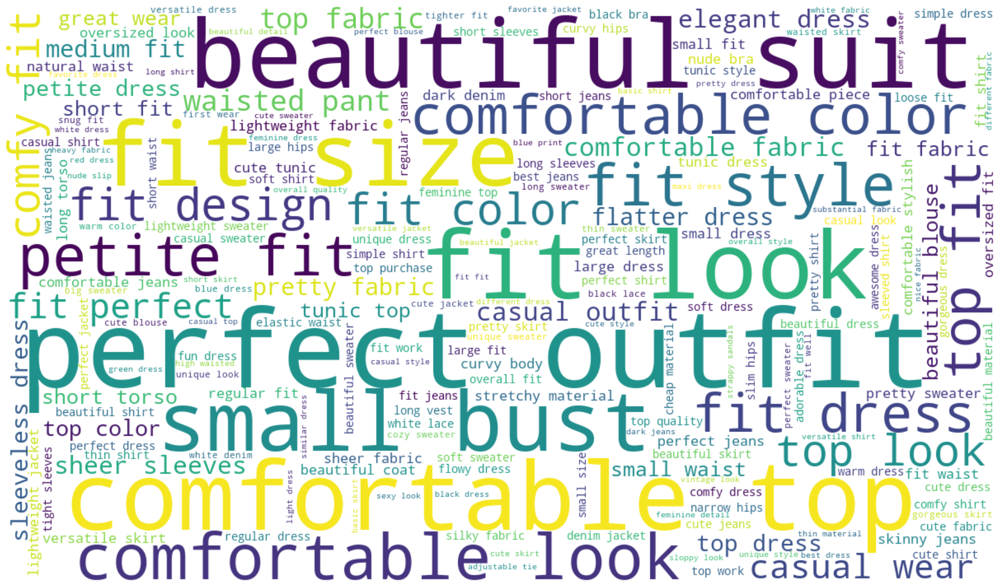

In [12]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nltk


word_bag_freq = nltk.FreqDist(word_bag)

wordcloud = WordCloud(width=1200, height=700, background_color='white').generate_from_frequencies(word_bag_freq)

plt.figure(figsize=(24, 14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()



In [13]:
wordcloud.to_file("context_label_wordcloud.png")